In [ ]:
%load_ext autoreload
%autoreload 2
import sys
import os

while not os.getcwd().endswith('image_drift_generator'):
    os.chdir('..')
    print(os.getcwd())
import numpy as np
import matplotlib.pyplot as plt


from tqdm.auto import tqdm
import torch

import polars as pl
from image_drift_generator.image_generator import ImageDatasetGenerator
from image_drift_generator.enums import ImageTransform
from image_drift_generator.models import TransformInfo
from utils.plots import visualize_transformations

from utils.plots import (
    plot_histogram,
    plot_similarity_metric,
    plot_boxplot_metric,
)
import warnings

%matplotlib inline
warnings.filterwarnings('ignore')

# set tight layout
plt.rcParams.update({'figure.autolayout': True})

In [ ]:
img_path = '../../data/places/'
seed = 42

In [ ]:
image_generator = ImageDatasetGenerator(
    seed=seed,
    input_path=img_path,
)

In [ ]:
drift_levels = np.round(np.arange(0.1, 1.1, 0.1), 2)
print(drift_levels)

## Default Transformation


In [ ]:
default_transform_lists = [
    [
        TransformInfo(
            transf_type=ImageTransform.DEFAULT,
            drift_level=drift_levels[i],
        ),
    ]
    for i in range(len(drift_levels))
]

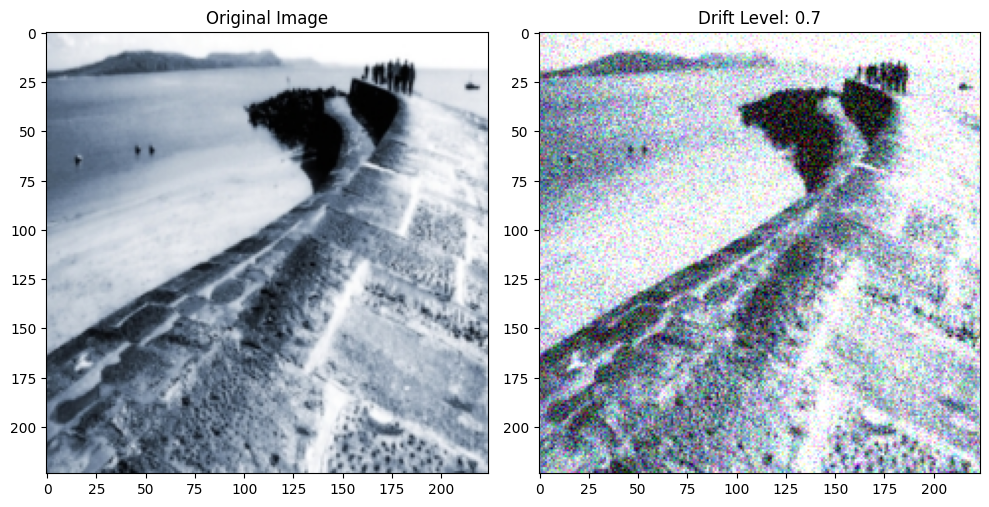

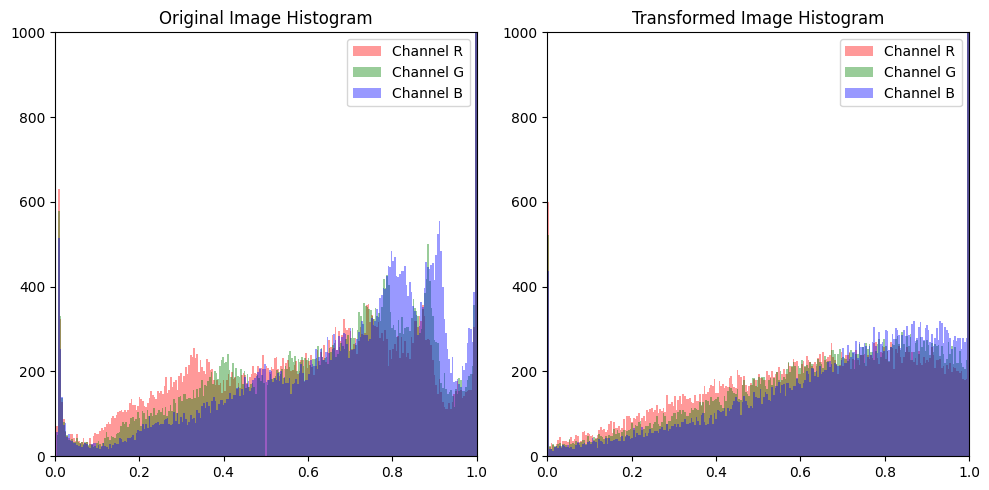

Default transformations:  70%|███████   | 7/10 [00:11<00:05,  1.70s/it]

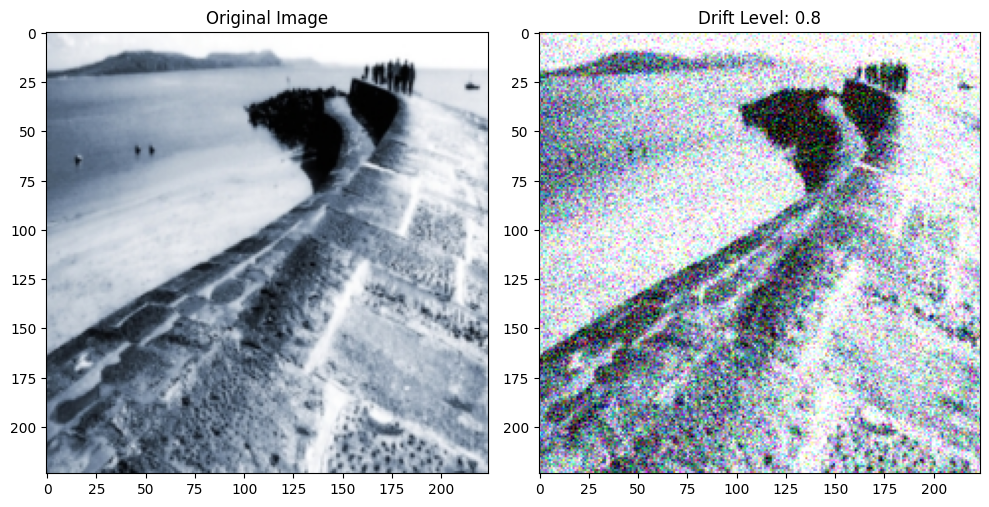

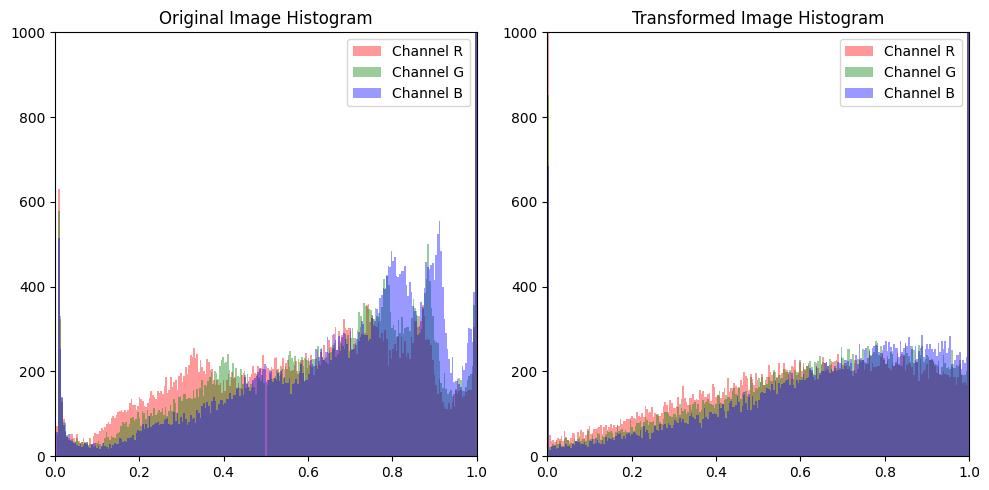

Default transformations:  80%|████████  | 8/10 [00:13<00:03,  1.69s/it]

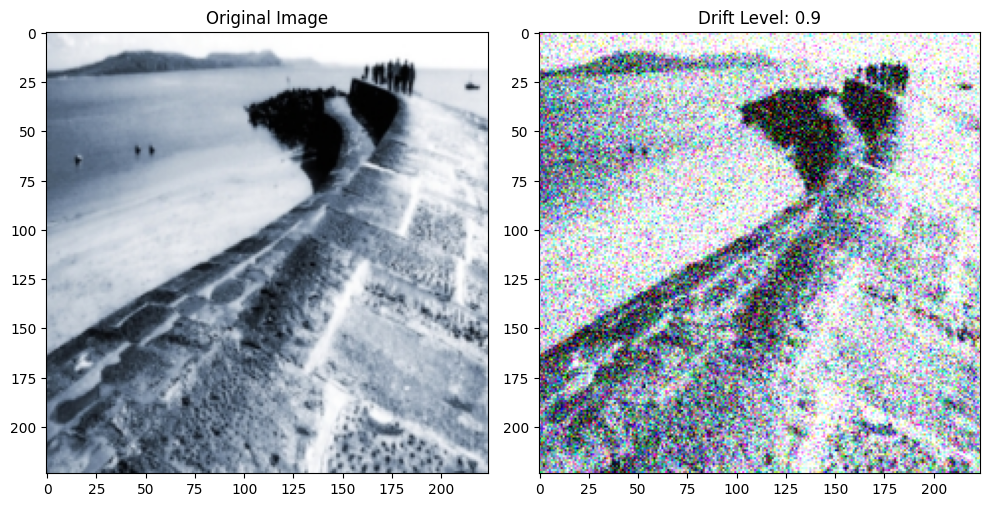

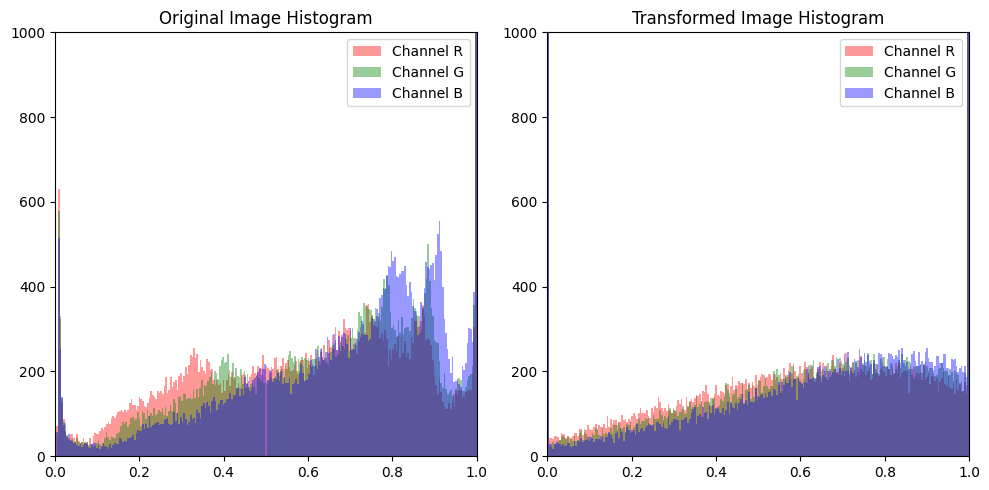

Default transformations:  90%|█████████ | 9/10 [00:15<00:01,  1.70s/it]

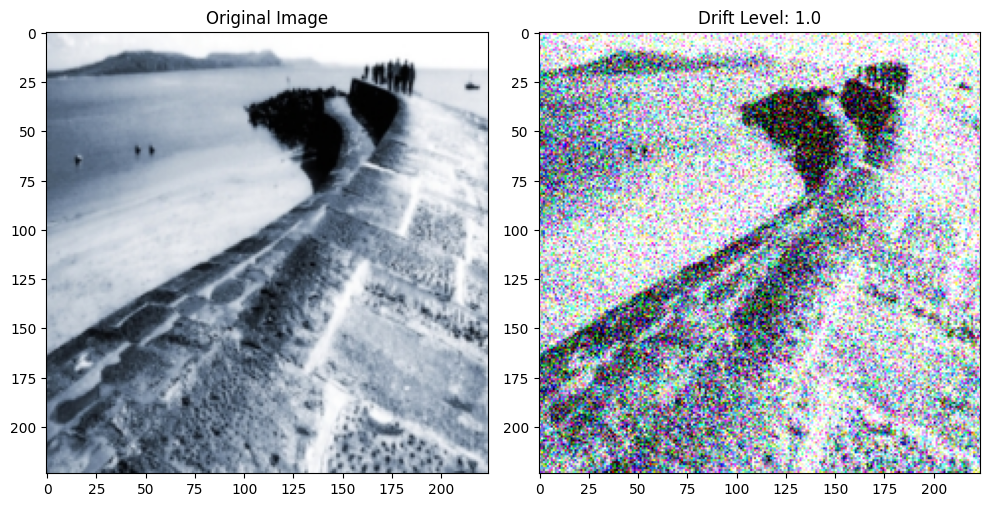

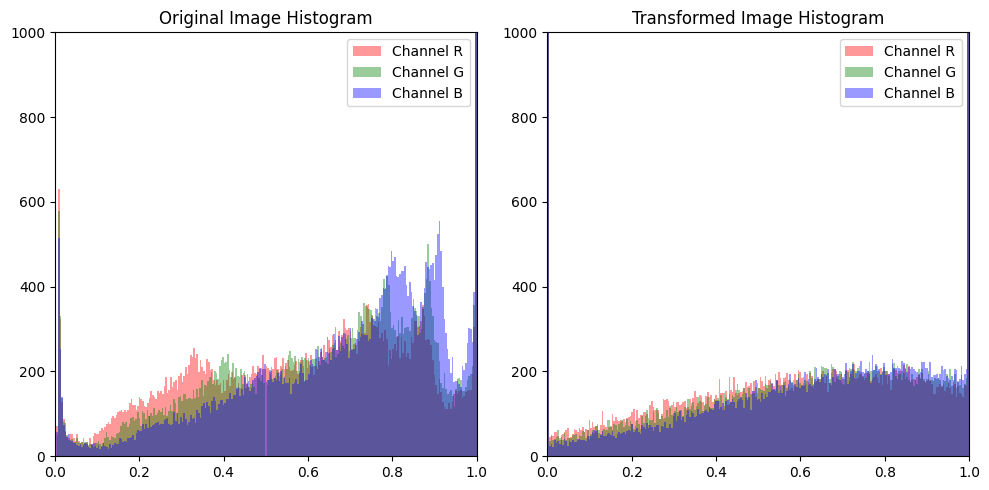

Default transformations: 100%|██████████| 10/10 [00:16<00:00,  1.69s/it]


In [6]:
visualize_transformations(
    image_generator=image_generator,
    transform_lists=default_transform_lists,
    description='Default transformations',
)

In [7]:
default_results = []
for transform_list in tqdm(
    default_transform_lists,
    desc='Transformations',
    total=len(default_transform_lists),
):
    image_generator.add_abrupt_drift(transform_list)
    default_results.append(image_generator.evaluate_transformation_pipeline())
default_results = [item for sublist in default_results for item in sublist]

Transformations:   0%|          | 0/10 [00:00<?, ?it/s]

In [8]:
default_df = pl.DataFrame(default_results)
default_grouped_df = (
    default_df.group_by(pl.col(image_generator.DRIFT_LEVEL_COLUMN))
    .agg(
        [
            pl.col(image_generator.SIMILARITY_COLUMN),
        ]
    )
    .sort(image_generator.DRIFT_LEVEL_COLUMN)
)

In [9]:
plot_similarity_metric(
    default_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Default',
)

plot_boxplot_metric(
    default_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Default',
)

## Brightness & Contrast


In [ ]:
brightness_transformation_lists = [
    [
        TransformInfo(
            transf_type=ImageTransform.BRIGHTNESS,
            drift_level=drift_levels[i],
        ),
    ]
    for i in range(len(drift_levels))
]

contrast_transformation_lists = [
    [
        TransformInfo(
            transf_type=ImageTransform.CONTRAST,
            drift_level=drift_levels[i],
        ),
    ]
    for i in range(len(drift_levels))
]

In [ ]:
visualize_transformations(
    image_generator=image_generator,
    transform_lists=brightness_transformation_lists,
    description='brightness',
)

In [ ]:
visualize_transformations(
    image_generator=image_generator,
    transform_lists=contrast_transformation_lists,
    description='contrast',
)

## Rotation Transformation


In [ ]:
rotate_transform_lists = [
    [
        TransformInfo(
            transf_type=ImageTransform.ROTATE,
            drift_level=drift_levels[i],
        ),
    ]
    for i in range(len(drift_levels))
]

In [ ]:
rotate_results = []
for transform_list in tqdm(
    rotate_transform_lists,
    desc='Transformations',
    total=len(rotate_transform_lists),
):
    image_generator.add_abrupt_drift(transform_list)
    rotate_results.append(image_generator.evaluate_transformation_pipeline())
rotate_results = [item for sublist in rotate_results for item in sublist]

In [ ]:
rotate_df = pl.DataFrame(rotate_results)
rotate_grouped_df = (
    rotate_df.group_by(pl.col(image_generator.DRIFT_LEVEL_COLUMN))
    .agg(
        [
            pl.col(image_generator.SIMILARITY_COLUMN),
        ]
    )
    .sort(image_generator.DRIFT_LEVEL_COLUMN)
)

In [ ]:
plot_similarity_metric(
    rotate_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Rotate',
)

plot_boxplot_metric(
    rotate_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Rotate',
)

## Color Jitter Transformation

- Brightness
- Contrast
- Saturation
- Hue


In [ ]:
color_jitter_transform_lists = [
    [
        TransformInfo(
            transf_type=ImageTransform.BRIGHTNESS,
            drift_level=drift_levels[i],
        ),
        TransformInfo(
            transf_type=ImageTransform.CONTRAST,
            drift_level=drift_levels[i],
        ),
        TransformInfo(
            transf_type=ImageTransform.SATURATION,
            drift_level=drift_levels[i],
        ),
        # TransformInfo(
        #     transf_type=ImageTransform.HUE,
        #     drift_level=drift_levels[i],
        # ),
    ]
    for i in range(len(drift_levels))
]

In [ ]:
visualize_transformations(
    image_generator=image_generator,
    transform_lists=color_jitter_transform_lists,
    description='color_jitter',
)

In [ ]:
color_jitter_results = []
for transform_list in tqdm(
    color_jitter_transform_lists,
    desc='Transformations',
    total=len(color_jitter_transform_lists),
):
    image_generator.add_abrupt_drift(transform_list)
    color_jitter_results.append(
        image_generator.evaluate_transformation_pipeline()
    )
# Flatten the color_jitter_results
color_jitter_results = [
    item for sublist in color_jitter_results for item in sublist
]

color_jitter_df = pl.DataFrame(color_jitter_results)
color_jitter_grouped_df = (
    color_jitter_df.group_by(pl.col(image_generator.DRIFT_LEVEL_COLUMN))
    .agg(
        [
            pl.col(image_generator.SIMILARITY_COLUMN),
        ]
    )
    .sort(image_generator.DRIFT_LEVEL_COLUMN)
)

In [ ]:
plot_similarity_metric(
    color_jitter_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Color Jitter',
)

plot_boxplot_metric(
    color_jitter_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Color Jitter',
)

## Gaussian Blur Transformation


In [ ]:
gaussian_blur_transform_lists = [
    [
        TransformInfo(
            transf_type=ImageTransform.GAUSSIAN_BLUR,
            drift_level=drift_levels[i],
        ),
    ]
    for i in range(len(drift_levels))
]

In [ ]:
visualize_transformations(
    image_generator=image_generator,
    transform_lists=gaussian_blur_transform_lists,
    description='gaussian blur',
)

In [ ]:
gaussian_blur_results = []
for transform_list in tqdm(
    gaussian_blur_transform_lists,
    desc='Transformations',
    total=len(gaussian_blur_transform_lists),
):
    image_generator.add_abrupt_drift(transform_list)
    gaussian_blur_results.append(
        image_generator.evaluate_transformation_pipeline()
    )
# Flatten the color_jitter_results
gaussian_blur_results = [
    item for sublist in gaussian_blur_results for item in sublist
]

gaussian_blur_df = pl.DataFrame(gaussian_blur_results)
gaussian_blur_grouped_df = (
    gaussian_blur_df.group_by(pl.col(image_generator.DRIFT_LEVEL_COLUMN))
    .agg(
        [
            pl.col(image_generator.SIMILARITY_COLUMN),
        ]
    )
    .sort(image_generator.DRIFT_LEVEL_COLUMN)
)

In [ ]:
plot_similarity_metric(
    gaussian_blur_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Gaussian Blur',
)

plot_boxplot_metric(
    gaussian_blur_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Gaussian Blur',
)

## Gaussian Noise Transformation


In [ ]:
gaussian_noise_transform_lists = [
    [
        TransformInfo(
            transf_type=ImageTransform.GAUSSIAN_NOISE,
            drift_level=drift_levels[i],
        ),
    ]
    for i in range(len(drift_levels))
]

In [ ]:
visualize_transformations(
    image_generator=image_generator,
    transform_lists=gaussian_noise_transform_lists,
    description='gaussian noise',
)

In [ ]:
gaussian_noise_results = []
for transform_list in tqdm(
    gaussian_noise_transform_lists,
    desc='Transformations',
    total=len(gaussian_noise_transform_lists),
):
    image_generator.add_abrupt_drift(transform_list)
    gaussian_noise_results.append(
        image_generator.evaluate_transformation_pipeline()
    )
# Flatten the color_jitter_results
gaussian_noise_results = [
    item for sublist in gaussian_noise_results for item in sublist
]


In [ ]:
gaussian_noise_df = pl.DataFrame(gaussian_noise_results)

gaussian_noise_grouped_df = (
    gaussian_noise_df.group_by(pl.col(image_generator.DRIFT_LEVEL_COLUMN))
    .agg(
        [
            pl.col(image_generator.SIMILARITY_COLUMN),
        ]
    )
    .sort(image_generator.DRIFT_LEVEL_COLUMN)
)

In [ ]:
plot_similarity_metric(
    gaussian_noise_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Gaussian Noise',
)
plot_similarity_metric(
    gaussian_noise_grouped_df,
    image_generator.SIMILARITY_COLUMN,
    [image_generator.DRIFT_LEVEL_COLUMN],
    title='Gaussian Noise',
)